# Overview
## CTML Take-Home Test

This test consists of two challenges, each to be completed using Python and the usual data science stack, and each intended to take no more than hour.

# Business Objective & Challenge
## 1: Breast Cancer Dataset EDA
The “wdbc” data-set you will be working with can be downloaded from here.
Please produce a well-presented Jupyter notebook – including any visualisations you feel are useful – which addresses the following:

 a.	What are the mean, median and standard deviation of the “perimeter” feature?

b.	Is the first feature in this data set (the “radius”) normally distributed? Quantify your answer. If not, what might be a more appropriate distribution?

c.	Train a classifier to predict the diagnosis of malignant or benign. Compare the results of two classifiers e.g. SVM, logistic regression, decision tree etc.

# ML Development Process


## Import Packeges

The following code is written in Python 3.x. Libraries provide pre-written functionality to perform necessary tasks.

In [1]:
#!pip install CyLP
# Error: ModuleNotFoundError: No module named 'cylp.cy.CyCoinIndexedVector'
# Solution : pip uninstall cylp
# pip install CyLP


In [2]:
from __future__ import division
import sys #access to system parameters 
import collections
import gc
gc.collect()
# Python Libraries for Data Cleaning and Manipulation
from collections import Counter
import numpy as np
from numpy.random import seed
from numpy.random import randn
import pandas as pd
import scipy as sp #collection of functions for scientific computing and advance mathematics
import math
import itertools
import imblearn
from imblearn.over_sampling import SMOTE
import random
from datetime import datetime
from time import *
from distfit import distfit
import re

In [3]:
# Python Libraries for Data Visualization
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.colors
import matplotlib.pylab as pylab
import seaborn as sns
from scipy.stats import pearsonr
from pandas.plotting import scatter_matrix
from mpl_toolkits.mplot3d import axes3d
import scipy
from scipy.stats import weibull_min
from scipy.stats import distributions
from scipy import stats
from reliability.Fitters import Fit_Weibull_2P
from scipy.stats import anderson
from statsmodels.graphics.gofplots import qqplot
from scipy.stats import shapiro
import scipy.sparse as sp
# Python Libraries for Model Helpers and Model Algorithms
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE, ADASYN
from sklearn import preprocessing
from sklearn.preprocessing import scale, normalize
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold
from sklearn.decomposition import PCA 
from sklearn.manifold import TSNE
from sklearn.feature_selection import SelectKBest,chi2
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection  import KFold   #For K-fold cross validation
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict,GridSearchCV
from sklearn import svm, tree, linear_model, ensemble
from sklearn import feature_selection ,model_selection ,metrics 
from sklearn.metrics import accuracy_score,f1_score,confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.feature_selection import RFE
from sklearn.metrics import precision_recall_fscore_support as score   
from sklearn.metrics import classification_report
# Hyperparameter Tunning
from hyperopt import hp, tpe, fmin, Trials, STATUS_OK
from skopt.space import Integer
from skopt.utils import use_named_args
from skopt import gp_minimize

from numpy import asarray

from timeit import default_timer as time
#from cylp.cy import cyclpSimplex
import cylp
#from CyLP.cy.CyClpSimplex import CyClpSimplex
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

# Set Random Seed
np.random.seed(42)
np.random.RandomState(42)

print('*'*100)
print('-'*31,'Your ML libraries have been loaded.','-'*31)
print('*'*100)

****************************************************************************************************
------------------------------- Your ML libraries have been loaded. -------------------------------
****************************************************************************************************


## Data Reading

### Attribute Information:

5. Number of instances: 569 

6. Number of attributes: 32 (ID, diagnosis, 30 real-valued input features)

7. Attribute information

1) ID number
2) Diagnosis (M = malignant, B = benign)
3-32)

Ten real-valued features are computed for each cell nucleus:

	a) radius (mean of distances from center to points on the perimeter)
	b) texture (standard deviation of gray-scale values)
	c) perimeter
	d) area
	e) smoothness (local variation in radius lengths)
	f) compactness (perimeter^2 / area - 1.0)
	g) concavity (severity of concave portions of the contour)
	h) concave points (number of concave portions of the contour)
	i) symmetry 
	j) fractal dimension ("coastline approximation" - 1)

Several of the papers listed above contain detailed descriptions of
how these features are computed. 

The mean, standard error, and "worst" or largest (mean of the three
largest values) of these features were computed for each image,
resulting in 30 features.  For instance, field 3 is Mean Radius, field
13 is Radius SE, field 23 is Worst Radius.

All feature values are recoded with four significant digits.

8. Missing attribute values: none

9. Class distribution: 357 benign, 212 malignant

In [4]:
# Reading Data from Web
df = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/breast-cancer-wisconsin/wdbc.data', header=None)

# Assign Variable name to datasets
df.columns = ['ID_number', 'Diagnosis', 'radius_mean', 'texture_mean','perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean','concavity_mean','concave_points_mean','symmetry_mean','fractal_dimension_mean',
             'radius_SE', 'texture_SE','perimeter_SE', 'area_SE', 'smoothness_SE', 'compactness_SE','concavity_SE','concave_points_SE','symmetry_SE','fractal_dimension_SE',
              'radius_Worst', 'texture_Worst','perimeter_Worst', 'area_Worst', 'smoothness_Worst', 'compactness_Worst','concavity_Worst','concave_points_Worst','symmetry_Worst','fractal_dimension_Worst'
             ]

#df = df.drop(['ID number'],axis=1)
print('Number of instances = %d' % (df.shape[0]))
print('Number of attributes = %d' % (df.shape[1]))
df.head()

Number of instances = 569
Number of attributes = 32


,ID_number,Diagnosis,radius_mean,texture_mean,...,concavity_Worst,concave_points_Worst,symmetry_Worst,fractal_dimension_Worst
0,842302,M,17.99,10.38,...,0.7119,0.2654,0.4601,0.1189
1,842517,M,20.57,17.77,...,0.2416,0.186,0.275,0.08902
2,84300903,M,19.69,21.25,...,0.4504,0.243,0.3613,0.08758
3,84348301,M,11.42,20.38,...,0.6869,0.2575,0.6638,0.173
4,84358402,M,20.29,14.34,...,0.4,0.1625,0.2364,0.07678


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID_number                569 non-null    int64  
 1   Diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave_points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_SE                569 non-null    float64
 13  texture_SE               569 non-null    float64
 14  perimeter_SE             5

## Data Quality

In [6]:
# Errors due to incomplete information
mask = df.isna().any()
list_columns = df.columns[mask].tolist()
#sns.heatmap(df[list_columns].isnull())
try:
    None in list_columns
    print(f" Error while reading file {list_columns} ")
except:
    sns.heatmap(df[list_columns].isnull())

 Error while reading file [] 


## Summarizing Missing Values

In [7]:
# Total missing values for each feature
pd.set_option("display.max.rows", None)

def missing_count(x):
    return sum(x.isnull())

print("Total number of missing values for each variable")

print(df.apply(missing_count,axis=0))

print("Total number of missing values for all variable")
print(df.isnull().sum().sum())

Total number of missing values for each variable
ID_number                  0
Diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave_points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_SE                  0
texture_SE                 0
perimeter_SE               0
area_SE                    0
smoothness_SE              0
compactness_SE             0
concavity_SE               0
concave_points_SE          0
symmetry_SE                0
fractal_dimension_SE       0
radius_Worst               0
texture_Worst              0
perimeter_Worst            0
area_Worst                 0
smoothness_Worst           0
compactness_Worst          0
concavity_Worst            0
concave_points_Worst       0
symmetry_Worst             0
fractal_dimension_Worst    0
dtype: int64
Total numb

# Data Exploration and Data Preparation
##   In this section the dataset will be analyzed to come up with the main characteristics that could help to understand the nature of the data. The analysis will assist to find out which features are more crucial in predicting whether a sample is cancerous or not.

## Descriptive Statistics

### Descriptive Statistics for Continuous variable

In [8]:
print(df.describe())

        ID_number  radius_mean  texture_mean  perimeter_mean  ...  concavity_Worst  concave_points_Worst  symmetry_Worst  fractal_dimension_Worst
count         569          569           569             569  ...              569                   569             569                      569
mean  3.03718e+07      14.1273       19.2896          91.969  ...         0.272188              0.114606        0.290076                0.0839458
std   1.25021e+08      3.52405       4.30104          24.299  ...         0.208624             0.0657323       0.0618675                0.0180613
min          8670        6.981          9.71           43.79  ...                0                     0          0.1565                  0.05504
25%        869218         11.7         16.17           75.17  ...           0.1145               0.06493          0.2504                  0.07146
50%        906024        13.37         18.84           86.24  ...           0.2267               0.09993          0.2822    

sq = np.sqrt(len(df))
df['perimeter_std'] = df['perimeter_SE']*sq


Calculating Standard Deviation
\begin{aligned} &\text{standard deviation } \sigma = \sqrt{ \frac{ \sum_{i=1}^n{\left(x_i - \bar{x}\right)^2} }{n-1} } \\ &\text{variance} = {\sigma ^2 } \\ &\text{standard error }\left( \sigma_{\bar x} \right) = \frac{{\sigma }}{\sqrt{n}} \\ &\textbf{where:}\\ &\bar{x}=\text{the sample's mean}\\ &n=\text{the sample size}\\ \end{aligned} 
​	  
standard deviation σ= 
n−1
∑ 
i=1
n
​	 (x 
i
​	 − 
x
ˉ
 ) 
2
 
​	 
​	 
variance=σ2
 

​	 
where:
x
ˉ
 =the sample’s mean
n=the sample size
​	

In [9]:
   
#mean_f = np.concatenate([['Diagnosis'], df.iloc[:,1:11].columns.tolist()])
error_f =  df.iloc[:,12:22]
#worst_f = np.concatenate([['Diagnosis'], df.iloc[:,21:31].columns.tolist()])    
error_f.head(5)

,radius_SE,texture_SE,perimeter_SE,area_SE,...,concavity_SE,concave_points_SE,symmetry_SE,fractal_dimension_SE
0,1.095,0.9053,8.589,153.4,...,0.05373,0.01587,0.03003,0.006193
1,0.5435,0.7339,3.398,74.08,...,0.0186,0.0134,0.01389,0.003532
2,0.7456,0.7869,4.585,94.03,...,0.03832,0.02058,0.0225,0.004571
3,0.4956,1.156,3.445,27.23,...,0.05661,0.01867,0.05963,0.009208
4,0.7572,0.7813,5.438,94.44,...,0.05688,0.01885,0.01756,0.005115


In [10]:
def std(df):
    sq = pow(len(df), .05)
    std = df * sq
    return  std

In [11]:
df[["std1","std2","std3","std4","std5","std6","std7","std8","std9","std10"]] = error_f.apply(std)

In [12]:
std_f =  df.iloc[:,32:44]
#print(std_f)

In [13]:
def xval(df):
    sq1 = pow(df, 2)
    le = len(df) - 1
    dev = pow((sq1 * le),.05)
    return  dev

In [14]:
df[["dev1","dev2","dev3","dev4","dev5","dev6","dev7","dev8","dev9","dev10"]] = std_f.apply(xval)

In [15]:
dev_f =  df.iloc[:,42:54]
#print(dev_f)

df.iloc[:,2:12]
testx = df.iloc[:,[2,12]]
testx.columns

In [16]:
mean_f =  df.iloc[:,2:12]


In [17]:
df[['radius', 'texture','perimeter', 'area', 'smoothness', 'compactness','concavity','concave_points','symmetry','fractal_dimension']] = df.iloc[:,2:12] + df.iloc[:,42:54].values


In [18]:
mean_f = np.concatenate([['Diagnosis'], df.iloc[:,1:11].columns.tolist()])
error_f = np.concatenate([['Diagnosis'], df.iloc[:,11:21].columns.tolist()])
worst_f = np.concatenate([['Diagnosis'], df.iloc[:,21:31].columns.tolist()])    

In [19]:
#error_f

# Challenge 1 What are the mean, median and standard deviation of the “perimeter” feature?

In [20]:
df['perimeter'].describe()

count       569
mean    93.5206
std     24.3584
min     45.2712
25%     76.6752
50%     87.7331
75%     105.766
max     190.431
Name: perimeter, dtype: float64

In [21]:
print("Mean of the perimeter is % 0.4s " %((df['perimeter']).mean())) 
print("Median of the perimeter is %  0.4s "%((df['perimeter']).median()))
print("Standard Deviation of the perimeter is %  0.4s "%((df['perimeter']).std()))

Mean of the perimeter is 93.5 
Median of the perimeter is 87.7 
Standard Deviation of the perimeter is 24.3 


# Challenge 2 Is the first feature in this data set (the “radius”) normally distributed? Quantify your answer. If not, what might be a more appropriate distribution?

In [22]:
# Anderson-Darling Test
# normality test
result = anderson(df['radius'])
print('Statistic: %.3f' % result.statistic)
p = 0
for i in range(len(result.critical_values)):
    sl, cv = result.significance_level[i], result.critical_values[i]
    if result.statistic < result.critical_values[i]:
        print('%.3f: %.3f, Radius looks normal (fail to reject H0)' % (sl, cv))
    else:
        print('%.3f: %.3f, Radius does not look normal (reject H0)' % (sl, cv))

Statistic: 11.288
15.000: 0.572, Radius does not look normal (reject H0)
10.000: 0.651, Radius does not look normal (reject H0)
5.000: 0.782, Radius does not look normal (reject H0)
2.500: 0.912, Radius does not look normal (reject H0)
1.000: 1.084, Radius does not look normal (reject H0)


In [23]:
# Performing the Shapiro-Wilk test to check normality 
stat, p = shapiro(df['radius'])
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0)')
else:
    print('Sample does not look Gaussian (reject H0)')

Statistics=0.939, p=0.000
Sample does not look Gaussian (reject H0)


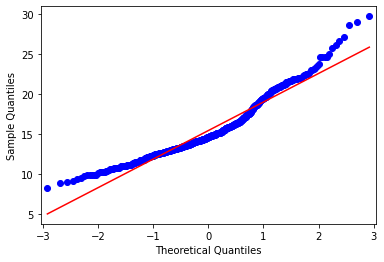

In [24]:
# q-q plot
qqplot(df['radius'], line='s')
plt.show()

The QQ plot showing the scatter plot of points in a diagonal line, Not fitting the expected diagonal pattern for a sample from a Gaussian distribution.

Results from Fit_Weibull_2P (95% CI):
Analysis method: Maximum Likelihood Estimation (MLE)
Failures / Right censored: 569/0 (0% right censored) 

Parameter  Point Estimate  Standard Error  Lower CI  Upper CI
    Alpha         16.8368        0.174303   16.4987    17.182
     Beta         4.30361        0.127381   4.06106   4.56066 

Goodness of fit    Value
 Log-likelihood -1559.38
           AICc  3122.79
            BIC  3131.46
             AD  15.3868 



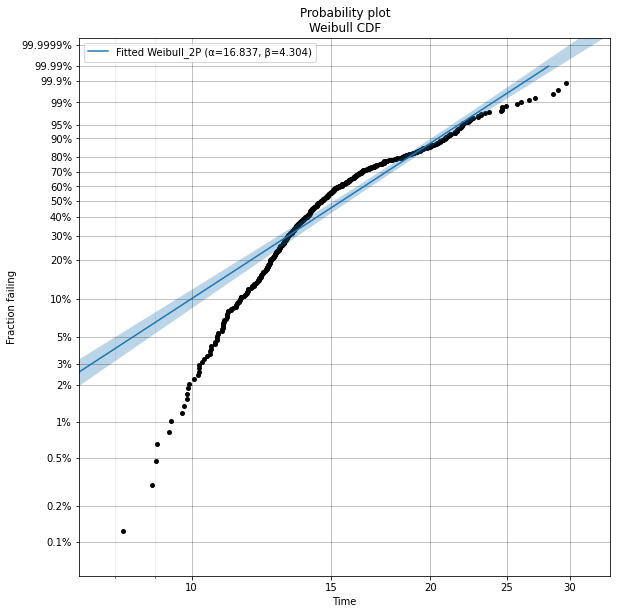

(2.1573759333010782, 8.120254271544503, 8.238643234775896)


KstestResult(statistic=0.07696975261495453, pvalue=0.0022285229880710518)

In [25]:
wb = Fit_Weibull_2P(failures=np.array(df['radius']))
plt.show()
#scipy.stats.ks_2samp(np.array(df['radius']), scipy.stats.weibull_min.rvs(*args, size=100000))
args = scipy.stats.weibull_min.fit(np.array(df['radius']))
print(args)

scipy.stats.kstest(np.array(df['radius']), 'weibull_min', args=args, N=100000)

In [26]:
# Hence the variable radius not fit to Weibull distribution , We need to fit our data to all of these distributions and compare the results.

[distfit] >fit..
[distfit] >transform..
[distfit] >[norm      ] [0.00 sec] [RSS: 0.0343779] [loc=15.403 scale=3.568]
[distfit] >[expon     ] [0.00 sec] [RSS: 0.1215392] [loc=8.201 scale=7.202]
[distfit] >[pareto    ] [0.03 sec] [RSS: 0.1824586] [loc=-0.014 scale=8.215]
[distfit] >[dweibull  ] [0.01 sec] [RSS: 0.0207798] [loc=14.765 scale=2.812]
[distfit] >[t         ] [0.03 sec] [RSS: 0.0269702] [loc=15.057 scale=3.068]
[distfit] >[genextreme] [0.03 sec] [RSS: 0.0120043] [loc=13.774 scale=2.764]
[distfit] >[gamma     ] [0.00 sec] [RSS: 0.0151390] [loc=7.456 scale=1.552]
[distfit] >[lognorm   ] [0.04 sec] [RSS: 0.0130124] [loc=5.434 scale=9.381]
[distfit] >[beta      ] [0.07 sec] [RSS: 0.0151531] [loc=7.458 scale=17555.260]
[distfit] >[uniform   ] [0.0 sec] [RSS: 0.1166051] [loc=8.201 scale=21.484]
[distfit] >[loggamma  ] [0.04 sec] [RSS: 0.0353816] [loc=-1052.631 scale=144.617]
[distfit] >Compute confidence interval [parametric]
[distfit] >plot..


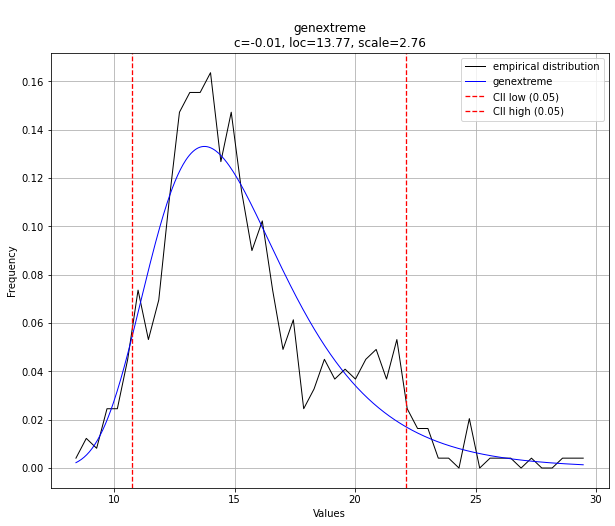

(<Figure size 720x576 with 1 Axes>,
 <AxesSubplot:title={'center':'\ngenextreme\nc=-0.01, loc=13.77, scale=2.76'}, xlabel='Values', ylabel='Frequency'>)

In [27]:
dist = distfit(todf=True,distr='popular')
dist.fit_transform(df['radius'])
dist.plot()

[distfit] >plot summary..


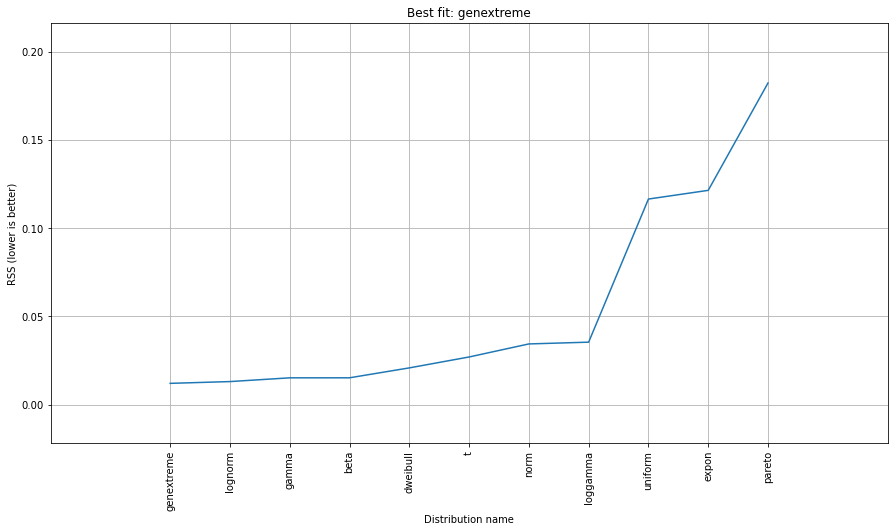

{'distr': <scipy.stats._continuous_distns.genextreme_gen object at 0x00000183A76CC5C8>, 'stats': 'RSS', 'params': (-0.00910693549126677, 13.773720942986829, 2.764235448543534), 'name': 'genextreme', 'model': <scipy.stats._distn_infrastructure.rv_frozen object at 0x00000183A69E1608>, 'score': 0.01200434166712046, 'loc': 13.773720942986829, 'scale': 2.764235448543534, 'arg': (-0.00910693549126677,), 'CII_min_alpha': 10.755935050414664, 'CII_max_alpha': 22.0960899574249}


In [28]:
# the best fit should be [genextreme],
# Make plot
dist.plot_summary()
# Best fitted model
best_distr = dist.model
print(best_distr)

In [29]:
# Best fitted model
best_distr = dist.model
print(best_distr)

{'distr': <scipy.stats._continuous_distns.genextreme_gen object at 0x00000183A76CC5C8>, 'stats': 'RSS', 'params': (-0.00910693549126677, 13.773720942986829, 2.764235448543534), 'name': 'genextreme', 'model': <scipy.stats._distn_infrastructure.rv_frozen object at 0x00000183A69E1608>, 'score': 0.01200434166712046, 'loc': 13.773720942986829, 'scale': 2.764235448543534, 'arg': (-0.00910693549126677,), 'CII_min_alpha': 10.755935050414664, 'CII_max_alpha': 22.0960899574249}


#  Categorical Variable (Target Variable)


In [30]:
print(df.describe(include='object'))

       Diagnosis
count        569
unique         2
top            B
freq         357


In [31]:
# We are droping ID columns from data
df = df.drop(['ID_number',], axis=1)

In [32]:
# Creating a binary target column to allow some data manipulations later on
df['Target'] = df['Diagnosis'].map({'B':0, 'M':1})

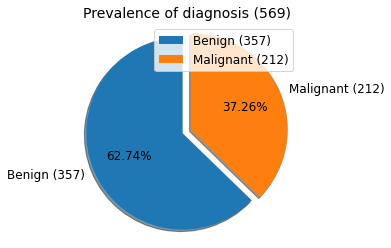

In [33]:
y = df['Target']
sum_D = len(y)
sum_M = (y.values==1).sum()
sum_B = sum_D - sum_M
frac_B = sum_B/sum_D
frac_M = 1 - frac_B
labels = 'Benign ('+str(sum_B)+')', 'Malignant ('+str(sum_M)+')'
sizes = [frac_B, frac_M]
explode = (0, 0.1)  # only "explode" the 2nd slice (i.e. 'Hogs')

fig1, ax1 = plt.subplots(figsize=(4, 4))
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.2f%%', shadow=True, startangle=90, textprops={'fontsize': 12})

ax1.set_title('Prevalence of diagnosis ('+str(sum_D)+')', fontsize=14)
ax1.axis('equal')
ax1.legend(fontsize=12, loc='best')
plt.show()

We are dealing with three measures: mean, std. error and the 'worst'. We should look at each separatedly.

We can plot the distribution and look for skewness on the mean values but there is not much we can obtain from plotting distributions of the other two:

Std. error is already a parameter obtained from a distribution and only have positive values so it's likely that we find it to be right-skewed.
Worst is a biased subsample of the measure's samples

The Central Limit Theroem states that the distribution of the mean values should look like a normal distribution. Let's explore that.

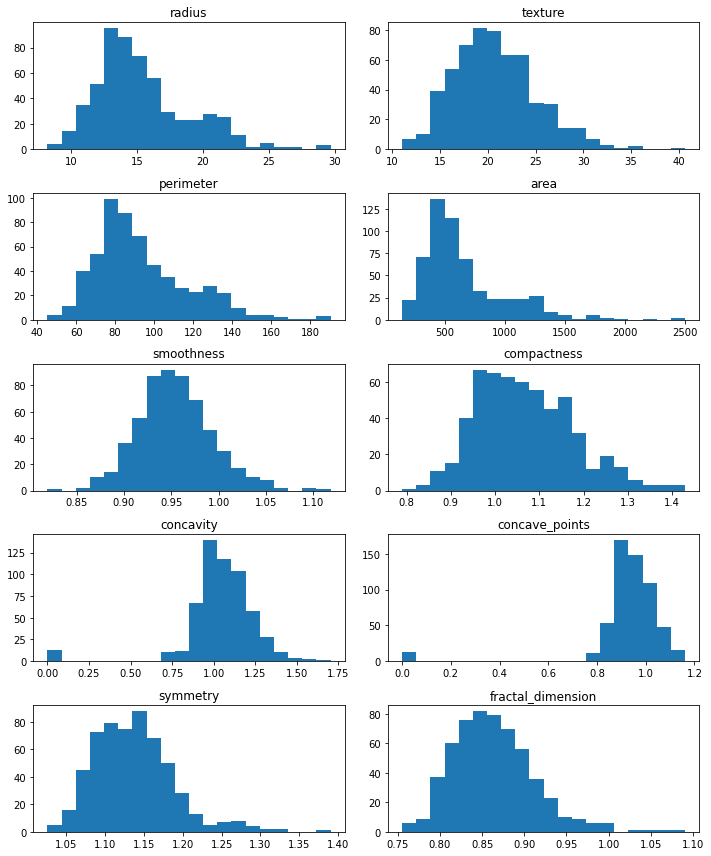

In [34]:
df.iloc[:,51:61].hist(figsize=(10,12), bins=20, layout=(5,2), grid=False)
plt.tight_layout();

We can see that some features are pretty skewed. We can measure its skewness using pandas skew method and we can try comparing it to a log transformation of the same values to see if we can reduce the skewness.

In [35]:
log_means = np.log1p(df.iloc[:,51:61])

skewness = pd.DataFrame({'Original Skewness':df.iloc[:,51:61].skew(),
                         'Log Transformed':log_means.skew()})
skewness['Skewness Reduction'] = skewness['Original Skewness'] - skewness['Log Transformed']
skewness

,Original Skewness,Log Transformed,Skewness Reduction
radius,0.957355,0.408596,0.548758
texture,0.639719,0.0462518,0.593467
perimeter,0.993114,0.341974,0.651141
area,1.64563,0.291617,1.35401
smoothness,0.438198,0.358949,0.0792483
compactness,0.518647,0.377294,0.141352
concavity,-2.26064,-3.64244,1.38181
concave_points,-4.38794,-5.19993,0.811986
symmetry,0.922728,0.822743,0.0999852
fractal_dimension,0.806985,0.706443,0.100541


We managed to greatly reduce skewness on radius, texture ,Perimeter and concavity. The other features were barely influenced by our log transformation.

In [36]:
# Getting lists with features. This will be useful on visualization
mean_f = np.concatenate([['Diagnosis'], df.iloc[:,1:11].columns.tolist()])
error_f = np.concatenate([['Diagnosis'], df.iloc[:,11:21].columns.tolist()])
worst_f = np.concatenate([['Diagnosis'], df.iloc[:,21:31].columns.tolist()])

## Mean Features Plot
There are a few things to point out on this plot.

From all histograms in the diagonal plots of the grid, only the fractal dimension has no visible effect on the square of the tumor. This is also seen in all the plots of the last row / column. This is convenient because the fractal dimension is the unexplained oblique feature that we have just talked about. This latter is a strong candidate for feature selection. The second lowest visual effect (I am saying visual because we will see some numbers later) is on symmetry. All other characteristics have a significant effect on the classification of tumors and the scatterplots look quite 'separable'. We can also see some 'beautiful plots' on the respective geometric features radius, area, and circumference, which are to be expected. This high correlation between features can be a problem for few ML algorithms.

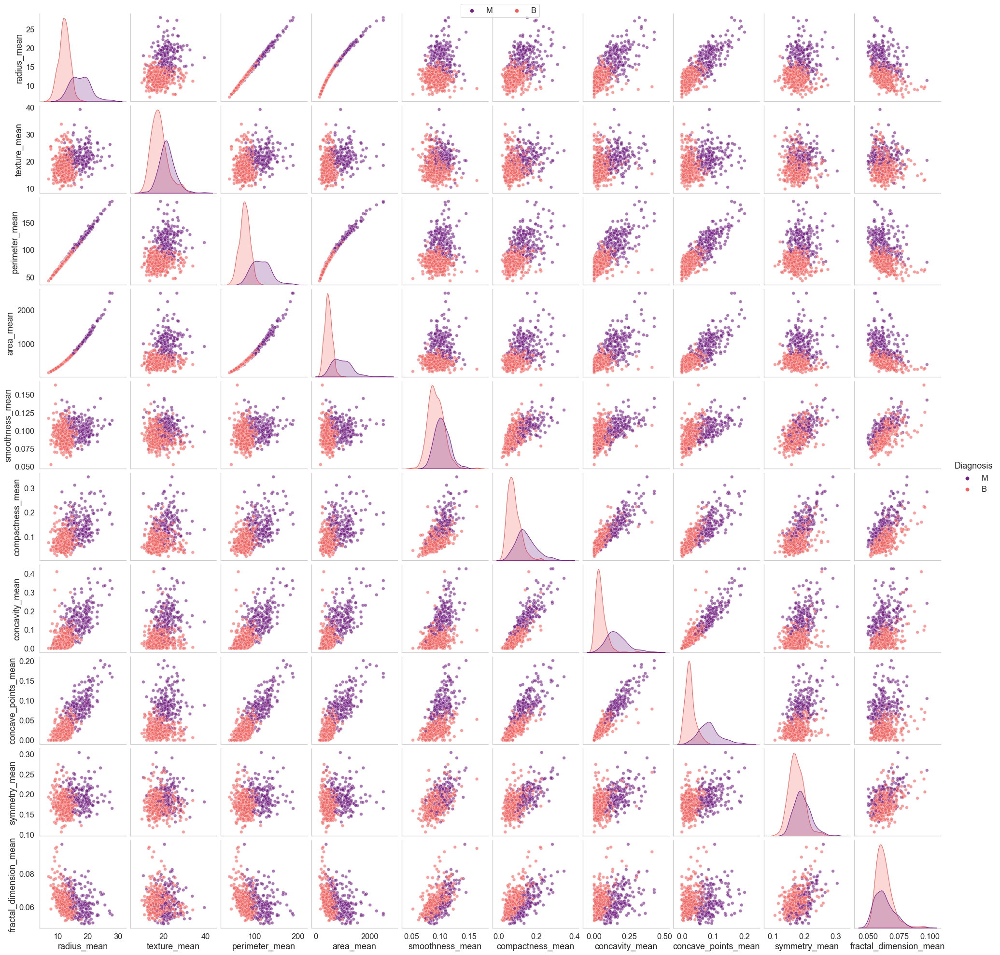

In [37]:
sns.set(style='whitegrid', font_scale=1.35, rc={'axes.grid': False})
p = sns.pairplot(df[mean_f], hue='Diagnosis',
             plot_kws={'alpha':0.6}, palette='magma')

plt.subplots_adjust(hspace=0.05, wspace=0.05)
handles = p._legend_data.values()
labels = p._legend_data.keys()
p.fig.legend(handles=handles, labels=labels, loc='upper center', ncol=2)
p.fig.set_dpi(80);

## Error Features Plot

We didn't expect to find anything here - and most feature errors have no effect - but look at radius ,perimeter , area  and compactness. The data suggest that the greater the error in these characteristics, the greater the likelihood of malignant tumors. How can we explain it?

Let us remember how standard error is calculated: by dividing the standard deviation by the square root of the sample size.

SE = σ / n
 
I will assume that the sample size does not change for each tumor sample, so the variance of the standard error is only due to the standard deviation.

Assuming that this is the case, we can interpret that there is a high irregularity on the geometry of the malignant tumor, which causes a high standard deviation!

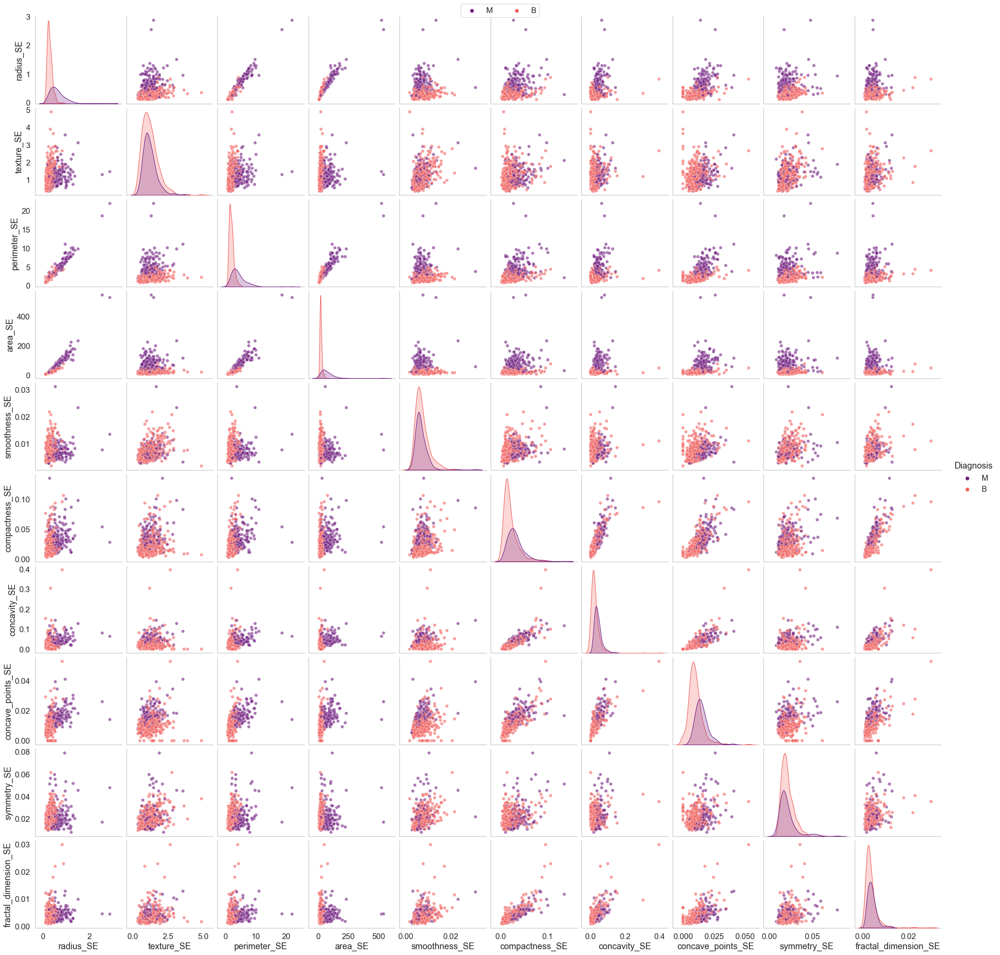

In [38]:
p = sns.pairplot(df[error_f], hue='Diagnosis',
             plot_kws={'alpha':0.6, }, palette='magma')

plt.subplots_adjust(hspace=0.05, wspace=0.05)
handles = p._legend_data.values()
labels = p._legend_data.keys()
p.fig.legend(handles=handles, labels=labels, loc='upper center', ncol=2)
p.fig.set_dpi(80);

## Worst Features Plot
These plots are very similar to the previous ones. This should be expected because the worst features are sub-samples of average data. Only by looking at those scenes is it difficult to say which is more important for the prediction model. We need to get some numbers to see if there is a significant difference.

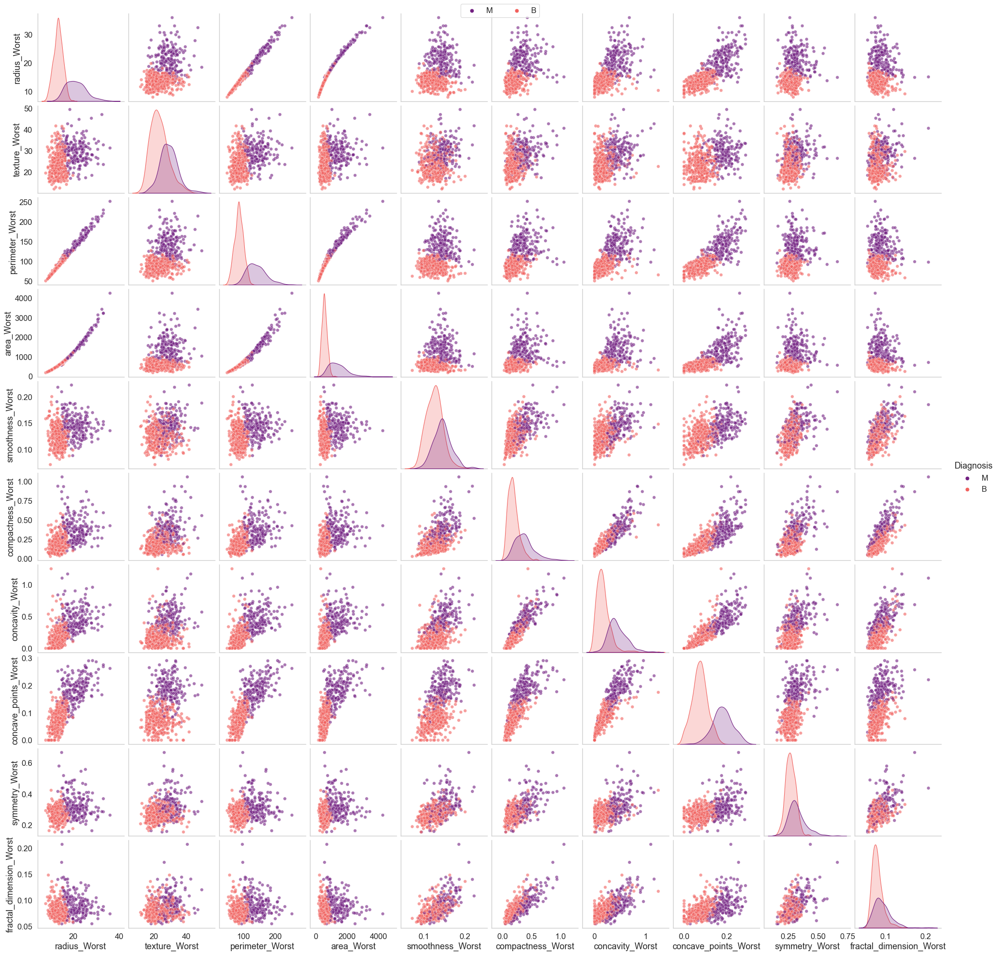

In [39]:
p = sns.pairplot(df[worst_f], hue='Diagnosis',
                 plot_kws={'alpha':0.6}, palette='magma')

plt.subplots_adjust(hspace=0.05, wspace=0.05)
handles = p._legend_data.values()
labels = p._legend_data.keys()
p.fig.legend(handles=handles, labels=labels, loc='upper center', ncol=2)
p.fig.set_dpi(80);

# Correlations
To calculate the correlations we can use the pandas corr method.

To visualize it better we can use the classic seaborn's heatmap - which is perfectly fine - but I will plot it using horizontal bar charts.

The downside of not plotting a heatmap is that we do not see how features are correlated to each other: there might be redundant features we don't need to feed a machine learning model. We can already see highly correlated features from our previous plots (e.g. Perimeter and Area), but I've chosen to keep them all and let the algorithms decide for them selves which ones are important and which ones aren't (feature selection and regularization).

## Correlation by Feature Type
First, lets see if we can find a predominant type of feature (worst, mean or se). Did we visualize it correctly in the previous plots?

In [40]:
# Save labels in y
y = df["Target"]
# Drop columns
X = df.drop([ "Diagnosis","Target"], axis=1)

In [41]:
corr=df.corr()["Target"]
corr[np.argsort(corr, axis=0)[:-1]]

smoothness_SE               -0.067016
std5                        -0.067016
dev5                       -0.0590473
dev9                       -0.0500802
fractal_dimension_mean     -0.0128376
std2                      -0.00830333
texture_SE                -0.00830333
std9                      -0.00652176
symmetry_SE               -0.00652176
dev2                        0.0259589
fractal_dimension_SE        0.0779724
std10                       0.0779724
smoothness                  0.0799513
fractal_dimension            0.140132
symmetry                     0.143869
dev10                        0.159742
dev8                         0.245655
std7                          0.25373
concavity_SE                  0.25373
std6                         0.292999
compactness_SE               0.292999
dev7                         0.295925
fractal_dimension_Worst      0.323872
symmetry_mean                0.330499
smoothness_mean               0.35856
dev6                         0.361266
concave_poin

<AxesSubplot:>

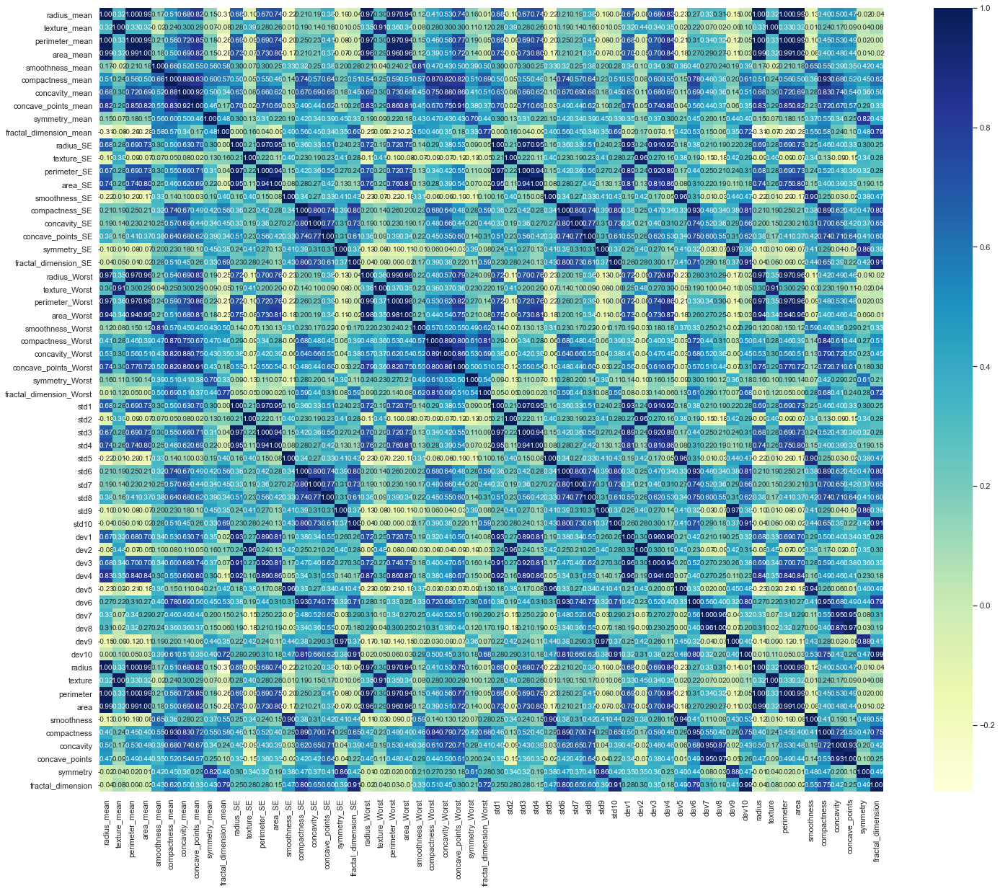

In [42]:
# Plot a Correlation chart
corr = X.corr() # .corr is used for find corelation
#plt.figure(figsize=(20,15))
sns.set(rc={'figure.figsize':(25,20)})
# plot a heatmap
sns.heatmap(corr, cbar = True,  square = True, annot=True, fmt= '.2f',annot_kws={'size': 10},
           xticklabels= X.columns, yticklabels= X.columns,
           cmap= 'YlGnBu') 

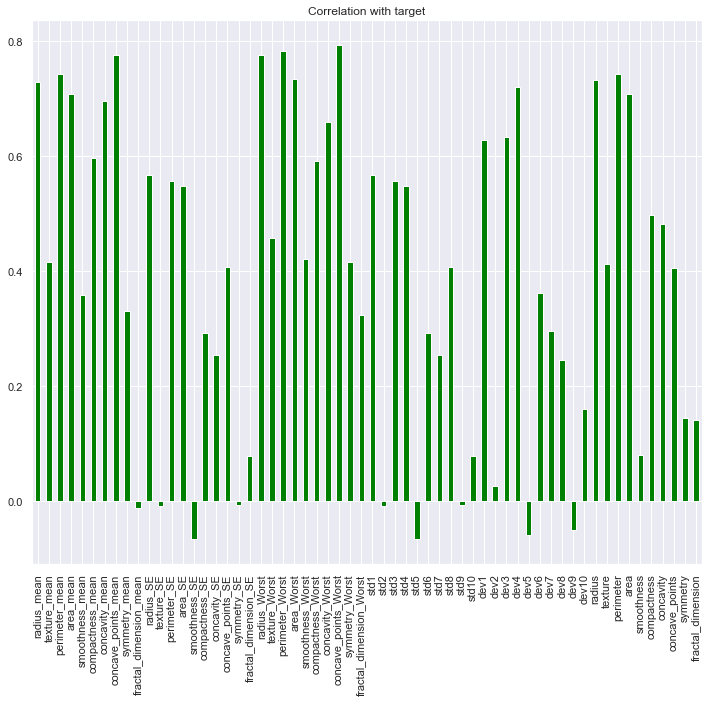

In [43]:
df.drop('Target', axis=1).corrwith(df.Target).plot(kind='bar', grid=True, figsize=(12, 10), title="Correlation with target",color="green");

*There is some stronge correlations: *
Features like radius_mean, Perimeter_mean, area_mean, (something)_se, (something)_worst, have a natural correlation because all these are generated using same data.We can see that there are many columns which are very highly correlated which causes multicollinearity so we have to remove highly correlated features.

### Positive Correlation:
Radius, Perimeter and Area have stronge positive correlation

In [44]:
print(pearsonr(X.loc[:,'radius_mean'],X.loc[:,'area_mean']))
print(pearsonr(X.loc[:,'radius_mean'],X.loc[:,'perimeter_mean']))
print(pearsonr(X.loc[:,'area_mean'],X.loc[:,'perimeter_mean']))

(0.9873571700566124, 0.0)
(0.9978552814938108, 0.0)
(0.9865068039913903, 0.0)


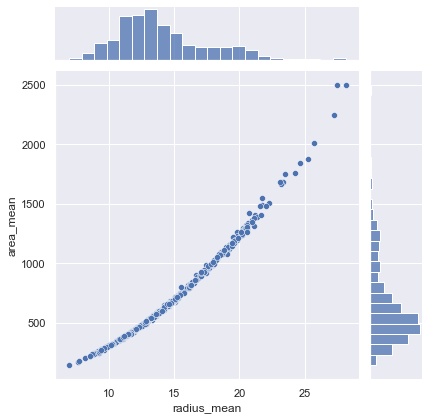

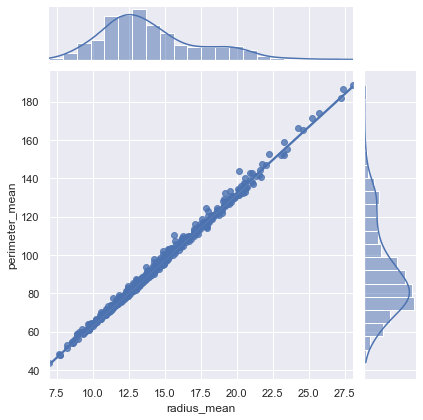

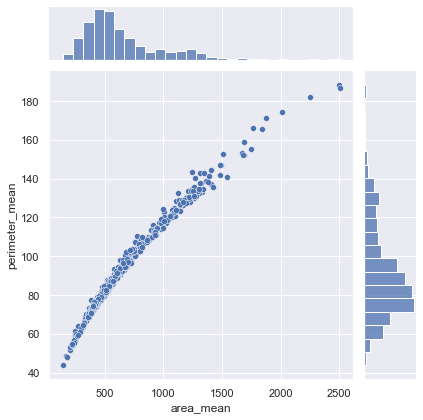

In [45]:
# Plot correlation between 2 features and distribution
sns.jointplot(X.loc[:,'radius_mean'], 
              X.loc[:,'area_mean'], 
              kind="scatter")

sns.jointplot(X.loc[:,'radius_mean'], 
              X.loc[:,'perimeter_mean'], 
              kind="reg")

sns.jointplot(X.loc[:,'area_mean'], 
              X.loc[:,'perimeter_mean'], 
              kind="scatter")

### Radius have a strong positive correlation with Concave Points

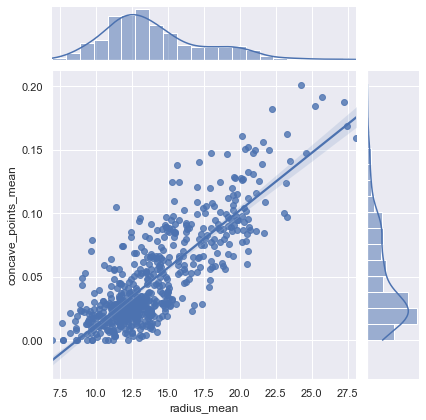

In [46]:
# Plot correlation between 2 features and distribution
sns.jointplot(X.loc[:,'radius_mean'], 
              X.loc[:,'concave_points_mean'], 
              kind="reg")

In [47]:
print(pearsonr(X.loc[:,'radius_mean'],X.loc[:,'concave_points_mean']))

(0.8225285223871794, 4.350746544989606e-141)


### Compacteness, Concavity and Concave Points have strong positive correlation

In [48]:
print(pearsonr(X.loc[:,'compactness_mean'],X.loc[:,'concavity_mean']))
print(pearsonr(X.loc[:,'compactness_mean'],X.loc[:,'concave_points_mean']))
print(pearsonr(X.loc[:,'concavity_mean'],X.loc[:,'concave_points_mean']))

(0.8831206701772508, 1.6230020517287733e-188)
(0.8311350431336987, 1.2405897980689087e-146)
(0.9213910263788594, 6.7887913511707e-235)


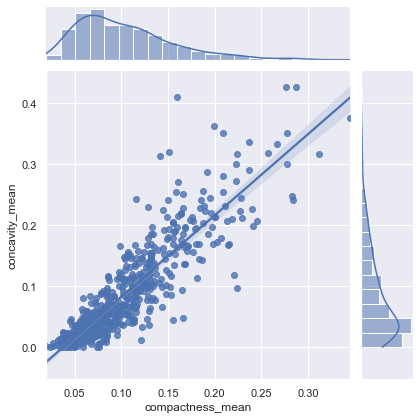

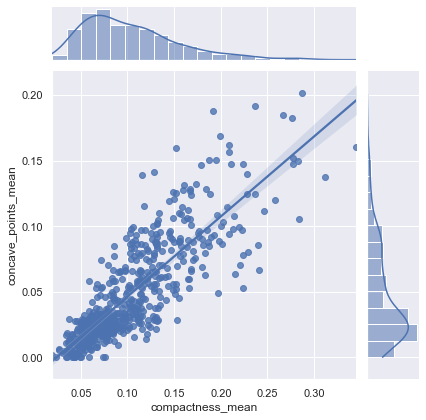

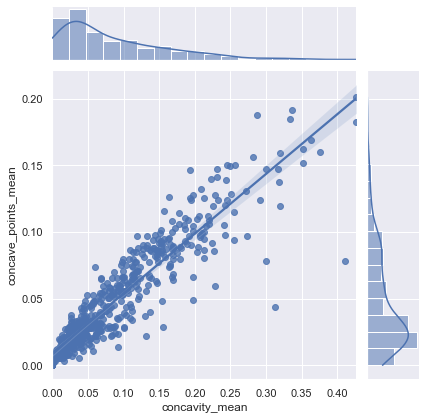

In [49]:
# Plot correlation between 2 features and distribution
sns.jointplot(X.loc[:,'compactness_mean'], 
              X.loc[:,'concavity_mean'], 
              kind="reg")

sns.jointplot(X.loc[:,'compactness_mean'], 
              X.loc[:,'concave_points_mean'], 
              kind="reg")


sns.jointplot(X.loc[:,'concavity_mean'], 
              X.loc[:,'concave_points_mean'], 
              kind="reg")

### Negative Correlation
Fractal Dimention have some negative correlation with Radius, Perimeter and Area

In [50]:
print(pearsonr(X.loc[:,'fractal_dimension_mean'],X.loc[:,'radius_mean']))
print(pearsonr(X.loc[:,'fractal_dimension_mean'],X.loc[:,'perimeter_mean']))
print(pearsonr(X.loc[:,'fractal_dimension_mean'],X.loc[:,'area_mean']))

(-0.3116308263092902, 2.7954516725313118e-14)
(-0.2614769080663335, 2.388802772934627e-10)
(-0.28310981169142624, 6.0015219335930026e-12)


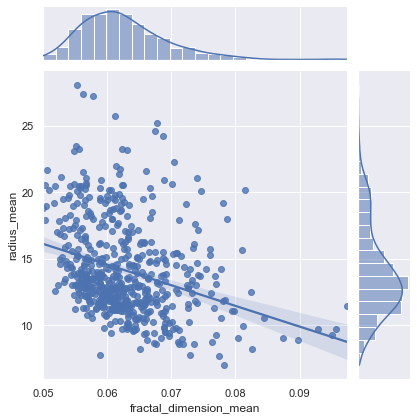

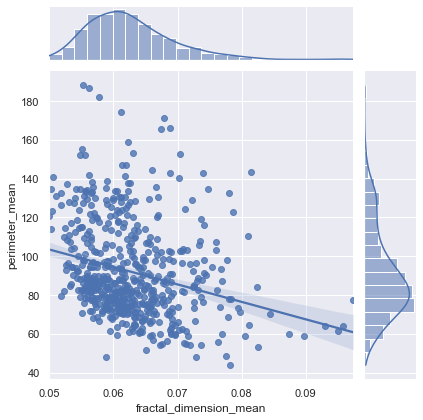

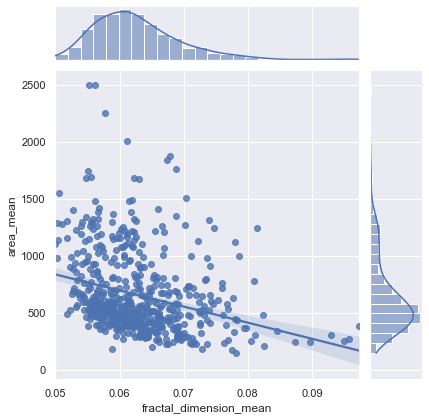

In [51]:
# Plot correlation between 2 features and distribution
sns.jointplot(X.loc[:,'fractal_dimension_mean'], 
              X.loc[:,'radius_mean'], 
              kind="reg")

sns.jointplot(X.loc[:,'fractal_dimension_mean'], 
              X.loc[:,'perimeter_mean'], 
              kind="reg")

sns.jointplot(X.loc[:,'fractal_dimension_mean'], 
              X.loc[:,'area_mean'], 
              kind="reg")

Insights from the plot:

We can observe that for all features except for Fractal Dimension have a similar pattern: The two highest correlated feature types are WORST and MEAN and the lowest is the STANDARD ERROR.
Fractal dimension has been the exception since all that matters in terms of this feature are the worst measures.
That said, we must remember that Pearson's correlation can only measure two individual features and we can't see how the combination of features influence in our target. As We've mentioned: We will keep them and let my model decide.

# Feature engineering

## We are Creating a Volume Mean Feature using radius_mean

In [52]:
# defining pi
import math
mean_volume = []
pi = 3.1415
mean_volume = pd.DataFrame(map(lambda x: ((4/3)*pi*pow(x,3)),X['radius_mean']))

In [53]:
# Creating a new feature
X["mean_volume"]= pd.DataFrame(mean_volume)

In [54]:
# Creating a new feature adding up some phisical measuraments
X["mesuraments_sum_mean"] = X["radius_mean"] + X["perimeter_mean"] + X["area_mean"]

## Feature Scaling

Since the range of values of raw data varies widely, in some machine learning algorithms, objective functions will not work properly without normalization. For example, the majority of classifiers calculate the distance between two points by the Euclidean distance. If one of the features has a broad range of values, the distance will be governed by this particular feature. Therefore, the range of all features should be normalized so that each feature contributes approximately proportionately to the final distance.

In [55]:
# Define a scaler function
def scaler(df):
    """The Function receive a Dataframe and return a Scaled Dataframe"""
    scaler = preprocessing.MinMaxScaler()
    scaled_df = scaler.fit_transform(df)
    scaled_df = pd.DataFrame(scaled_df, columns=df.columns)
    
    return scaled_df

# testing scaler
scaled_df = scaler(X)

scaled_df.head(5)

,radius_mean,texture_mean,perimeter_mean,area_mean,...,symmetry,fractal_dimension,mean_volume,mesuraments_sum_mean
0,0.521037,0.0226581,0.545989,0.363733,...,0.588076,0.524882,0.250649,0.3758
1,0.643144,0.272574,0.615783,0.501591,...,0.217986,0.320445,0.382391,0.509729
2,0.601496,0.39026,0.595743,0.449417,...,0.413966,0.393087,0.333471,0.459446
3,0.21009,0.360839,0.233501,0.102906,...,0.831588,0.683513,0.0525405,0.111381
4,0.629893,0.156578,0.630986,0.48929,...,0.277365,0.417501,0.36636,0.498988


In [56]:
scaled_df["Target"] = y

## Features Distribution

In [57]:
corr=scaled_df.corr()["Target"]
corr[np.argsort(corr, axis=0)[:-1]]

smoothness_SE               -0.067016
std5                        -0.067016
dev5                       -0.0590473
dev9                       -0.0500802
fractal_dimension_mean     -0.0128376
std2                      -0.00830333
texture_SE                -0.00830333
std9                      -0.00652176
symmetry_SE               -0.00652176
dev2                        0.0259589
std10                       0.0779724
fractal_dimension_SE        0.0779724
smoothness                  0.0799513
fractal_dimension            0.140132
symmetry                     0.143869
dev10                        0.159742
dev8                         0.245655
concavity_SE                  0.25373
std7                          0.25373
compactness_SE               0.292999
std6                         0.292999
dev7                         0.295925
fractal_dimension_Worst      0.323872
symmetry_mean                0.330499
smoothness_mean               0.35856
dev6                         0.361266
concave_poin

In [58]:
y = scaled_df['Target']
scaled_df = scaled_df.drop(["Target"], axis=1)

Text(0.5, 1.0, 'Plot 9.3a')

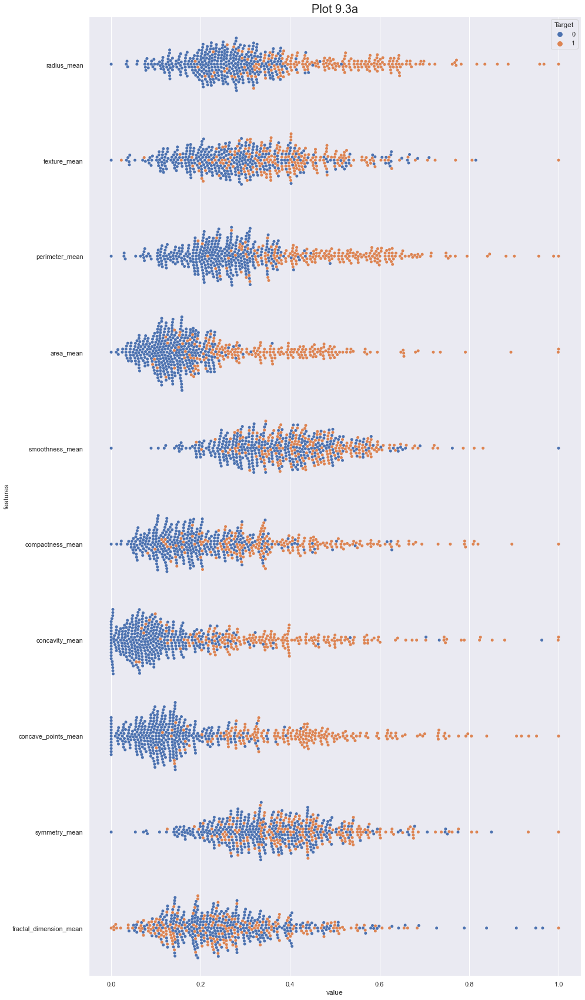

In [59]:
# Plot a Swarmplot
sns.set(style="whitegrid", palette="muted")
data_plot = scaled_df
data_plot = pd.concat([y,data_plot.iloc[:,0:10]],axis=1)
data_plot = pd.melt(data_plot,id_vars="Target",
                    var_name="features",
                    value_name='value')
#plt.figure(figsize=(10,10))
sns.set(rc={'figure.figsize':(15,30)})
sns.swarmplot(x="value", y="features", hue="Target", data=data_plot)
plt.title('Plot 9.3a', fontsize =20)

Text(0.5, 1.0, 'Plot 9.3b')

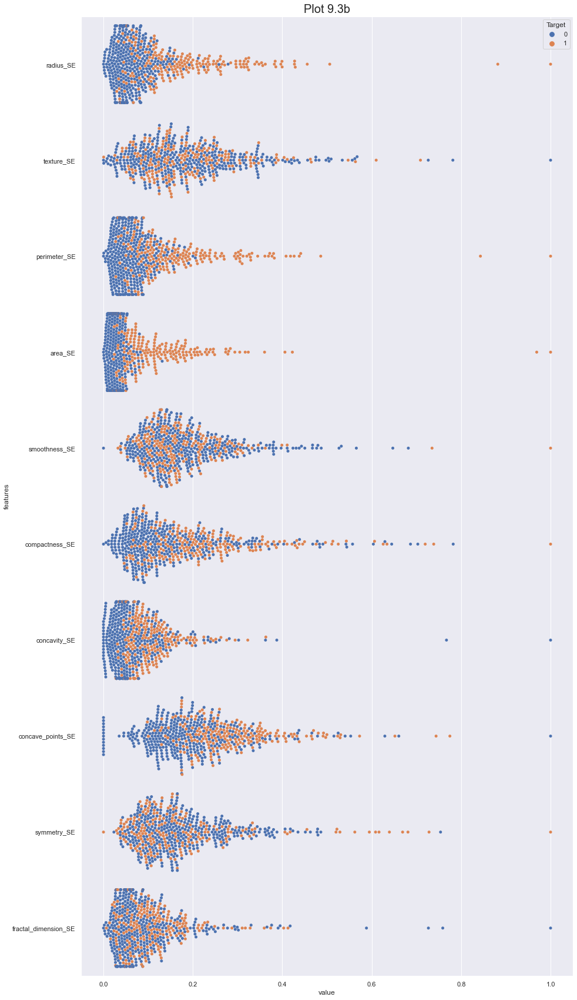

In [60]:
# Plot a Swarmplot
sns.set(style="whitegrid", palette="muted")
data_plot = scaled_df
data_plot = pd.concat([y,data_plot.iloc[:,10:20]],axis=1)
data_plot = pd.melt(data_plot,id_vars="Target",
                    var_name="features",
                    value_name='value')
#plt.figure(figsize=(10,10))
sns.set(rc={'figure.figsize':(15,30)})
sns.swarmplot(x="value", y="features", hue="Target", data=data_plot)
plt.title('Plot 9.3b', fontsize =20)

Text(0.5, 1.0, 'Plot 9.3c')

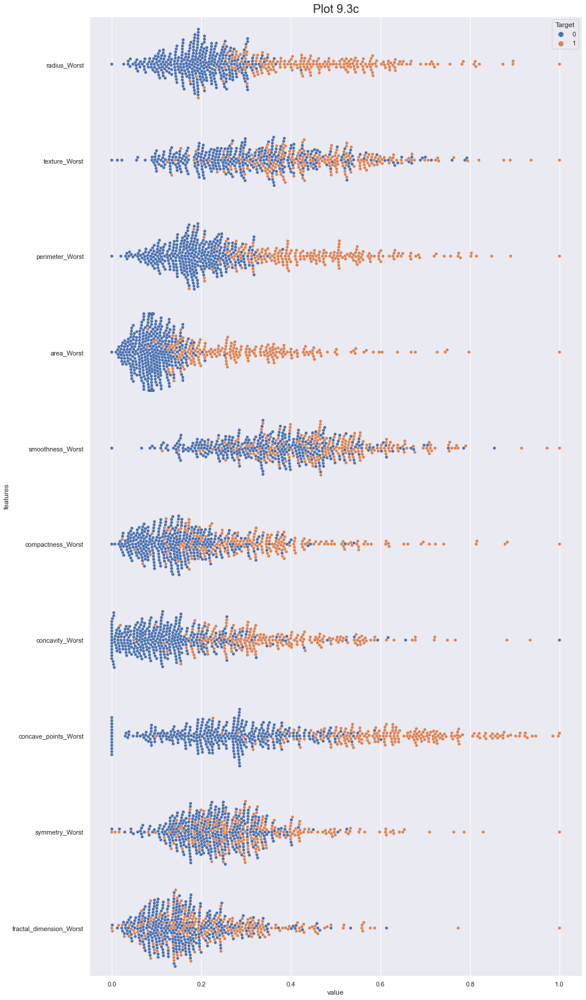

In [61]:
# Plot a Swarmplot
sns.set(style="whitegrid", palette="muted")
data_plot = scaled_df
data_plot = pd.concat([y,data_plot.iloc[:,20:30]],axis=1)
data_plot = pd.melt(data_plot,id_vars="Target",
                    var_name="features",
                    value_name='value')
#plt.figure(figsize=(10,10))
sns.set(rc={'figure.figsize':(15,30)})
sns.swarmplot(x="value", y="features", hue="Target", data=data_plot)
plt.title('Plot 9.3c', fontsize =20)

Text(0.5, 1.0, 'Plot 9.3d')

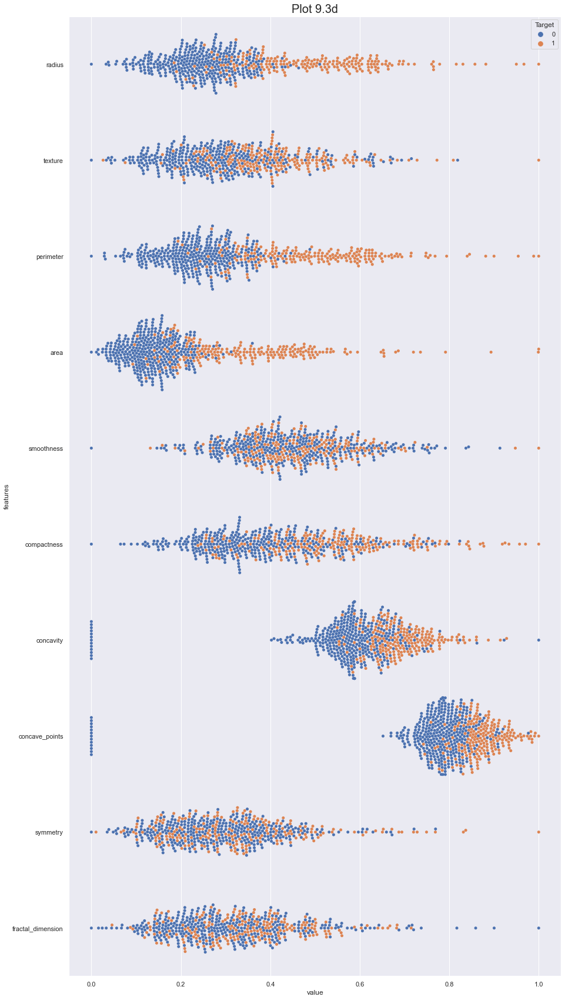

In [62]:
# Plot a Swarmplot
sns.set(style="whitegrid", palette="muted")
data_plot = scaled_df
data_plot = pd.concat([y,data_plot.iloc[:,50:60]],axis=1)
data_plot = pd.melt(data_plot,id_vars="Target",
                    var_name="features",
                    value_name='value')
#plt.figure(figsize=(10,10))
sns.set(rc={'figure.figsize':(15,30)})
sns.swarmplot(x="value", y="features", hue="Target", data=data_plot)
plt.title('Plot 9.3d', fontsize =20)

# Model development

# Data Partition :Splitting the Data for training and testing

In [63]:
X_train, test, y_train, ytest = train_test_split(X, y, test_size = 0.2, random_state = 0)
print(f"Train Data: {X_train.shape}, {y_train.shape}")
print(f"Train Data: {test.shape}, {ytest.shape}")

Train Data: (455, 62), (455,)
Train Data: (114, 62), (114,)


In [64]:
# Upsampling using SMOTE
counter = Counter(y_train)
counter

Counter({0: 290, 1: 165})

# Imbalanced Learning
* Naive random over-sampling*
There are three different way to deal with Imbalanced data. The most naive strategy is to generate new samples by randomly sampling with replacement the current available samples. The RandomOverSampler offers such scheme and Apart from the random sampling with replacement, there is two popular methods to over-sample minority classes: 
(i)  Random Over Sampler 
(ii) Synthetic Minority Oversampling Technique (SMOTE) 
(iii) Adaptive Synthetic (ADASYN) sampling method. 

[(0, 290), (1, 290)]


<AxesSubplot:xlabel='Target', ylabel='count'>

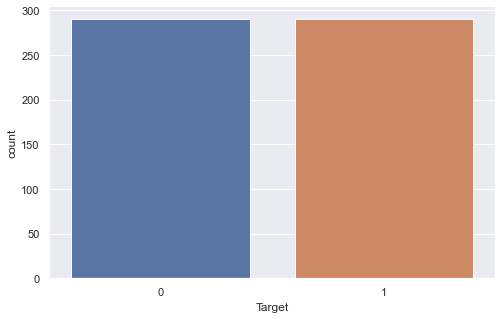

In [65]:
# Define a function to Balance data

def resample(X,y, method="RandomOverSampler"):
    
    """The function receive features and labels (X, y) and a method to balance data
    available methods RandomOverSampler, ADASYN, SMOTE
    
    The funcion returns X_resampled, y_resampled"""
    
    if method == "RandomOverSampler":
        X_resampled, y_resampled = RandomOverSampler().fit_resample(X, y)
    if method == "ADASYN":
        X_resampled, y_resampled = ADASYN().fit_resample(X, y)
    else:
        X_resampled, y_resampled = SMOTE().fit_resample(X, y)
        
    print(sorted(Counter(y_resampled).items()))
    
    X_resampled = pd.DataFrame(X_resampled, columns=X.columns)
        
    return X_resampled, y_resampled


# choose between RandomOverSampler, ADASYN, SMOTE
X_resampled, y_resampled = resample(X_train,y_train, "SMOTE")

sns.set(rc={'figure.figsize':(8,5)})

sns.countplot(y_resampled) 

In [66]:
print(f"Total Data after Upsampling: {len(X_resampled)}")
#X_resampled, y_resampled

Total Data after Upsampling: 580


In [67]:
print(f"Train Data: {X_resampled.shape}, {y_resampled.shape}")
print(f"Test Data: {test.shape}, {ytest.shape}")

Train Data: (580, 62), (580,)
Test Data: (114, 62), (114,)


# Feature Selection using Recursive feature elimination (RFE)
Feature selection works by selecting the best features based on univariate statistical tests. It can be seen as a preprocessing step to an estimator. SelectKBest removes all but the k highest scoring features

#Recursive feature elimination (RFE) with random forest : It uses one of the classification methods that assign weight to each attribute. Those whose absolute weight is the smallest are cut from the set of current features. That process is iteratively repeated over the set up to the desired number of features.

In [68]:
# Create the RFE object and rank each pixel
clf_rf = RandomForestClassifier(n_estimators=100,n_jobs= -1)      
rfe = RFE(estimator=clf_rf, n_features_to_select=10, step=1)
rfe = rfe.fit(X_resampled, y_resampled)

In [69]:
print('Chosen best 10 feature by rfe:',X_resampled.columns[rfe.support_])

Chosen best 10 feature by rfe: Index(['texture_mean', 'perimeter_mean', 'concavity_mean', 'concave_points_mean', 'radius_Worst', 'perimeter_Worst', 'area_Worst', 'concavity_Worst', 'concave_points_Worst', 'perimeter'], dtype='object')


In [70]:
import gc
gc.collect()

41816

In [71]:
# The "accuracy" scoring is proportional to the number of correct classifications
clf_rf_1 = RandomForestClassifier(n_estimators=500,n_jobs= -1)
rfecv = RFECV(estimator=clf_rf_1, step=1, cv=5,scoring='accuracy')   #5-fold cross-validation
rfecv = rfecv.fit(X_resampled, y_resampled)

print('Optimal number of features :', rfecv.n_features_)
print('Best features :', X_resampled.columns[rfecv.support_])

Optimal number of features : 17
Best features : Index(['texture_mean', 'perimeter_mean', 'concavity_mean', 'concave_points_mean', 'area_SE', 'radius_Worst', 'texture_Worst', 'perimeter_Worst', 'area_Worst', 'compactness_Worst', 'concavity_Worst',
       'concave_points_Worst', 'std4', 'radius', 'texture', 'perimeter', 'area'],
      dtype='object')


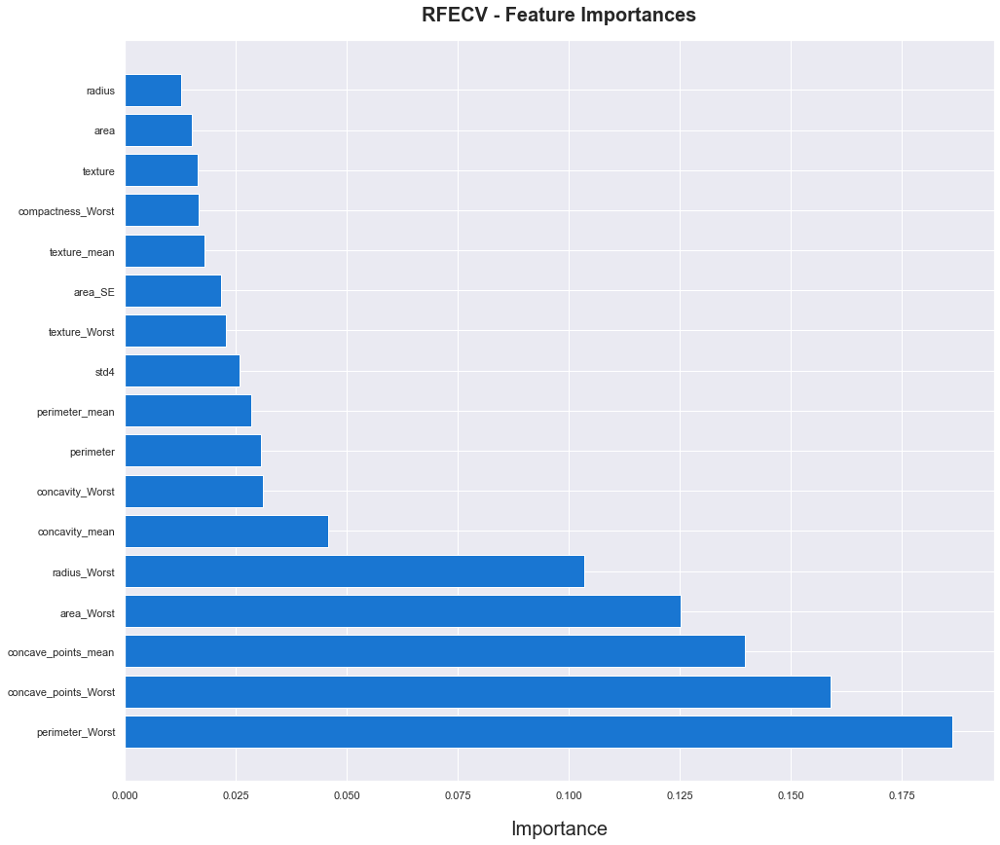

In [72]:
dset = pd.DataFrame()
dset['attr'] = X_resampled.columns[rfecv.support_]
dset['importance'] = rfecv.estimator_.feature_importances_

dset = dset.sort_values(by='importance', ascending=False)


plt.figure(figsize=(16, 14))
plt.barh(y=dset['attr'], width=dset['importance'], color='#1976D2')
plt.title('RFECV - Feature Importances', fontsize=20, fontweight='bold', pad=20)
plt.xlabel('Importance', fontsize=20, labelpad=20)
plt.show()

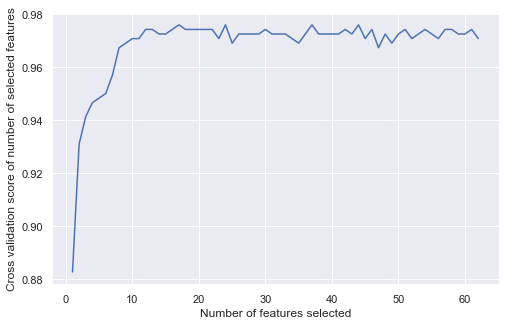

In [73]:
# Plot number of features VS. cross-validation scores
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score of number of selected features")
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)
plt.show()

In [74]:
f = rfecv.get_support(1) #the most important features
X_resampled1 = X_resampled[X_resampled.columns[f]] # final features`
X_resampled1.dtypes

texture_mean            float64
perimeter_mean          float64
concavity_mean          float64
concave_points_mean     float64
area_SE                 float64
radius_Worst            float64
texture_Worst           float64
perimeter_Worst         float64
area_Worst              float64
compactness_Worst       float64
concavity_Worst         float64
concave_points_Worst    float64
std4                    float64
radius                  float64
texture                 float64
perimeter               float64
area                    float64
dtype: object

In [75]:
X_resampled.shape

(580, 62)

In [76]:
X_resampled1.shape

(580, 17)

# Classification Model
we are going to build a classification model and evaluate its performance using the training set.

## Baseline Model 
### We are using Logistic regression , Support vector machine and Decision tree technique to train a classifier to predict the diagnosis of malignant or benign. 
### case 1 : select all Features

In [77]:
accuracy_all = []
csv_all = []
kfold = KFold(n_splits=5, random_state=42, shuffle=True) # k=5, split the data into 10 equal parts
xyz=[]
accuracy=[]
std=[]
classifiers=['Logistic Regression',
             'SVC',
             'DecisionTreeClassifier'
            ]

models=[LogisticRegression(),
        SVC(),
        DecisionTreeClassifier()
       ]
for i in models:
    model = i
    cv_result = cross_val_score(model,X_resampled, y_resampled, cv = kfold,scoring = "accuracy")
    cv_result=cv_result
    xyz.append(cv_result.mean())
    std.append(cv_result.std())
    accuracy.append(cv_result)
new_models_dataframe1=pd.DataFrame({'CV Mean':xyz,'Std':std},index=classifiers)       
new_models_dataframe1

,CV Mean,Std
Logistic Regression,0.944828,0.032531
SVC,0.853448,0.04496
DecisionTreeClassifier,0.932759,0.0191992


### case 2 : Select feaures based on Recursive feature elimination (RFE) with random forest

In [78]:
accuracy_all1 = []
csv_all1 = []
kfold = KFold(n_splits=5, random_state=42, shuffle=True) # k=5, split the data into 5 equal parts
xyz1=[]
accuracy1=[]
std1=[]
classifiers1=['Logistic Regression',
             'SVC',
             'DecisionTreeClassifier'
            ]

models=[LogisticRegression(),
        SVC(),
        DecisionTreeClassifier()
       ]
for i in models:
    model = i
    cv_result1 = cross_val_score(model,X_resampled1, y_resampled, cv = kfold,scoring = "accuracy")
    cv_result1=cv_result1
    xyz1.append(cv_result1.mean())
    std1.append(cv_result1.std())
    accuracy1.append(cv_result1)
new_models_dataframe2=pd.DataFrame({'CV Mean':xyz1,'Std':std1},index=classifiers1)       
new_models_dataframe2

,CV Mean,Std
Logistic Regression,0.955172,0.0355022
SVC,0.896552,0.0218088
DecisionTreeClassifier,0.932759,0.0100534


### Bayesian Optimization Hyperparameter Tuning

In [79]:
gc.collect()

7815

In [80]:
space = {'warm_start' : hp.choice('warm_start', [True, False]), 
             'fit_intercept' : hp.choice('fit_intercept', [True, False]),
             'tol' : hp.uniform('tol', 0.00001, 0.0001), 
             'C' : hp.uniform('C', 0.05, 3), 
             'solver' : hp.choice('solver', ['newton-cg', 'lbfgs', 'liblinear']), 
             'max_iter' : hp.choice('max_iter', range(100,1000)), 
             'class_weight' : 'balanced' 
      } 
def objective(space):
    model = LogisticRegression( warm_start = space['warm_start'],
                               fit_intercept = space['fit_intercept'],
                               tol = space['tol'],
                               C = space['C'],
                               solver = space['solver'],
                               max_iter = space['max_iter'],
                               class_weight = space['class_weight']
                              )
        
    accuracy = cross_val_score(model,X_resampled1, y_resampled, cv = 5).mean()

    # We aim to maximize accuracy, therefore we return it as a negative value
    return {'loss': -accuracy, 'status': STATUS_OK }
trials = Trials()
best = fmin(fn= objective,
            space= space,
            algo= tpe.suggest,
            max_evals = 500,
            trials= trials)
print(best)    


100%|█████████████████████████████████████████████| 500/500 [02:47<00:00,  2.98trial/s, best loss: -0.9655172413793103]
{'C': 2.9769862257971704, 'fit_intercept': 0, 'max_iter': 752, 'solver': 0, 'tol': 3.597853223445752e-05, 'warm_start': 0}


In [81]:
gc.collect()

341

In [82]:
space = {'splitter': hp.choice('splitter',['best','random']),
          'max_depth' : hp.choice( 'max_depth',[7,9,11,12,25]),
          'min_samples_leaf': hp.choice( 'min_samples_leaf',[1,2,3,4,5,6,7,8,9,10]),
          'min_weight_fraction_leaf' : hp.choice('min_weight_fraction_leaf',[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]),
           'max_features': hp.choice('max_features',['auto','log2','sqrt',None]),
           'max_leaf_nodes':hp.choice('max_leaf_nodes',[None,10,20,30,40,50,60,70,80,90] )
        }

def objective(space):
    model2 = DecisionTreeClassifier( splitter = space['splitter'] , max_depth = space['max_depth'] ,
                                   min_samples_leaf = space['min_samples_leaf'],
                                  min_weight_fraction_leaf = space['min_weight_fraction_leaf'] , 
                                   max_features = space['max_features'] ,
                                   max_leaf_nodes = space['max_leaf_nodes']
                                          )
    accuracy = cross_val_score(model2,X_resampled1, y_resampled, cv = 5).mean()
    # We aim to maximize accuracy, therefore we return it as a negative value
    return {'loss': -accuracy, 'status': STATUS_OK }
trials2 = Trials()
best2 = fmin(fn= objective,
            space= space,
            algo= tpe.suggest,
            max_evals = 500,
            trials= trials2)
print(best2)    

100%|█████████████████████████████████████████████| 500/500 [00:07<00:00, 65.37trial/s, best loss: -0.9103448275862067]
{'max_depth': 0, 'max_features': 0, 'max_leaf_nodes': 6, 'min_samples_leaf': 7, 'min_weight_fraction_leaf': 2, 'splitter': 0}


In [83]:
gc.collect()

76

In [84]:
space = {'C': hp.choice('C', [0.001,0.01, 0.1, 1, 10, 100]), 
             'kernel': hp.choice('kernel', ['rbf']), 
             'gamma': hp.choice('gamma', [0.0001, 0.001, 0.01, 0.1])
                } 

def objective1(space):
          model1 = SVC(C = space['C'], kernel = space['kernel'],
                gamma = space['gamma'] ,
                       probability = True, cache_size = 25000,shrinking = False
                    )
          accuracy1 = cross_val_score(model1,X_resampled1, y_resampled, cv = 5).mean()
         
    # We aim to maximize accuracy, therefore we return it as a negative value
          return {'loss': -accuracy1, 'status': STATUS_OK }
trials1 = Trials()
best1 = fmin(fn= objective1,
            space= space,
            algo= tpe.suggest,
            max_evals = 500,
            trials= trials1)
print(best1)    

100%|█████████████████████████████████████████████| 500/500 [06:11<00:00,  1.35trial/s, best loss: -0.9568965517241379]
{'C': 4, 'gamma': 0, 'kernel': 0}


In [85]:
gc.collect()

76

In [86]:
test1 = test[X_resampled.columns[f]]
#test1

### Final Model with feature selection and Hypertunning

### Logistic Regression Model

In [87]:
cvs_all = []
accuracy_all = []
clf = LogisticRegression(C = 2.729459175713594, fit_intercept = 0, max_iter = 842,solver = 'newton-cg' , tol = 5.530643336014357e-05,
                         warm_start = 0)
clf.fit( X_resampled1, y_resampled)
scores = cross_val_score(clf, X_resampled1, y_resampled, cv=5)
prediction = clf.predict(test1)
accuracy_all.append(accuracy_score(prediction, ytest))
cvs_all.append(np.mean(scores))

print("LogisticRegression Accuracy: {0:.2%}".format(accuracy_score(prediction, ytest)))
print("Cross validation score: {0:.2%} (+/- {1:.2%})".format(np.mean(scores), np.std(scores)*2))


LogisticRegression Accuracy: 94.74%
Cross validation score: 96.38% (+/- 4.68%)


              precision    recall  f1-score   support

           0       0.98      0.93      0.95        67
           1       0.90      0.98      0.94        47

    accuracy                           0.95       114
   macro avg       0.94      0.95      0.95       114
weighted avg       0.95      0.95      0.95       114



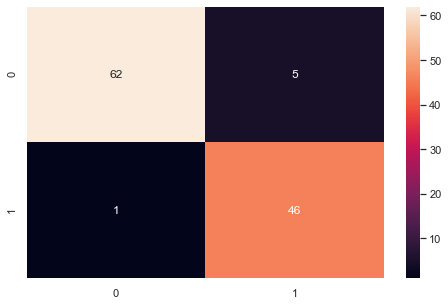

In [88]:
y_predict_logistic = clf.predict(test1)
cm = confusion_matrix(ytest, y_predict_logistic)
sns.heatmap(cm, annot=True)
print(classification_report(ytest, y_predict_logistic))

In [89]:
#test1 = test
#test1['y_predict_logistic'] = y_predict_logistic
LR = clf.predict_proba(test1)
LR = LR[:, 1]
#LR

### SVM Model

In [90]:
cvs_all = []
accuracy_all = []
clf11 = SVC(10, kernel = 'rbf',gamma = 0.0001 ,probability=True)
clf11.fit(X_resampled1, y_resampled)
prediction = clf11.predict(test1)
scores = cross_val_score(clf11, X_resampled1, y_resampled, cv=5)

accuracy_all.append(accuracy_score(prediction, ytest))
cvs_all.append(np.mean(scores))

print("SVC Accuracy: {0:.2%}".format(accuracy_score(prediction, ytest)))
print("Cross validation score: {0:.2%} (+/- {1:.2%})".format(np.mean(scores), np.std(scores)*2))


SVC Accuracy: 94.74%
Cross validation score: 95.69% (+/- 5.23%)


              precision    recall  f1-score   support

           0       0.96      0.96      0.96        67
           1       0.94      0.94      0.94        47

    accuracy                           0.95       114
   macro avg       0.95      0.95      0.95       114
weighted avg       0.95      0.95      0.95       114



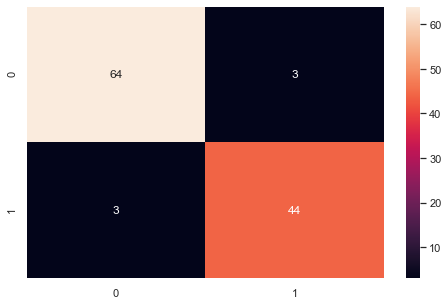

In [91]:
y_predict_SVM = clf11.predict(test1)
cm = confusion_matrix(ytest, y_predict_SVM)
sns.heatmap(cm, annot=True)
print(classification_report(ytest, y_predict_SVM))

In [92]:
#test1['y_predict_SVM'] = y_predict_SVM
SVM = clf11.predict_proba(test1)
SVM = SVM[:, 1]
#SVM

### Decision Tree Classifier

In [93]:
cvs_all = []
accuracy_all = []
clf12 = DecisionTreeClassifier(max_depth = 11,max_features = 'auto',
                               max_leaf_nodes = 70, min_samples_leaf = 8,
                               min_weight_fraction_leaf = 0.2,splitter = 'best')

clf12.fit(X_resampled1, y_resampled)
prediction = clf12.predict(test1)
scores = cross_val_score(clf12, X_resampled1, y_resampled, cv=5)

accuracy_all.append(accuracy_score(prediction, ytest))
cvs_all.append(np.mean(scores))

print("Dedicion Tree Accuracy: {0:.2%}".format(accuracy_score(prediction, ytest)))
print("Cross validation score: {0:.2%} (+/- {1:.2%})".format(np.mean(scores), np.std(scores)*2))


Dedicion Tree Accuracy: 89.47%
Cross validation score: 88.28% (+/- 3.55%)


In [94]:
print(best2)   
best2['max_depth']

{'max_depth': 0, 'max_features': 0, 'max_leaf_nodes': 6, 'min_samples_leaf': 7, 'min_weight_fraction_leaf': 2, 'splitter': 0}


0

              precision    recall  f1-score   support

           0       1.00      0.82      0.90        67
           1       0.80      1.00      0.89        47

    accuracy                           0.89       114
   macro avg       0.90      0.91      0.89       114
weighted avg       0.92      0.89      0.90       114



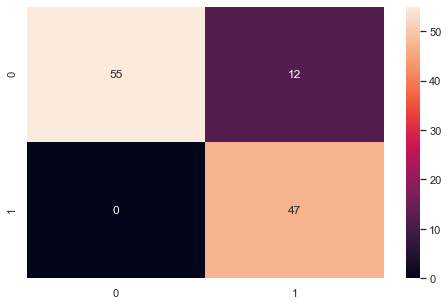

In [95]:
y_predict_DecisionTree = clf12.predict(test1)
cm = confusion_matrix(ytest, y_predict_DecisionTree)
sns.heatmap(cm, annot=True)
print(classification_report(ytest, y_predict_DecisionTree))

In [96]:
#test1['y_predict_DecisionTree'] = y_predict_SVM
DecisionTree = clf12.predict_proba(test1)
# keep probabilities for the positive outcome only
DecisionTree = DecisionTree[:, 1]
#DecisionTree

In [97]:
data = test1

In [98]:
data['LR'] = LR
data['SVM'] = SVM
data['DecisionTree'] = DecisionTree

In [99]:
data.shape

(114, 20)

In [100]:
data1 = data.iloc[:,17:20]

In [101]:
import re
a = np.array(data1['LR'].tolist())
b = np.array(data1['SVM'].tolist())
c = np.array(data1['DecisionTree'].tolist())
fp=np.vstack((a,b,c))
#print(food_list)
#print(np.vstack((a,b,c)))
#fp

# Challenge #3: Spearman’s Footrule Distance


In [102]:
from numpy import asarray

def spearman_footrule_distance(s,t):
    """
    Computes the Spearman footrule distance between two full lists of ranks:
        F(s,t) = sum[ |s(i) - t(i)| ]/S,
    the normalized sum over all elements in a set of the absolute difference between
    the rank according to s and t.  As defined, 0 <= F(s,t) <= 1.
    S is a normalizer which is equal to 0.5*len(s)^2 for even length ranklists and
    0.5*(len(s)^2 - 1) for odd length ranklists.
    If s,t are *not* full, this function should not be used. s,t should be array-like
    (lists are OK).
    """
    # check that size of intersection = size of s,t?
    assert len(s) == len(t)
    sdist = sum(abs(asarray(s) - asarray(t)))
    # c will be 1 for odd length lists and 0 for even ones
    c = len(s) % 2
    normalizer = 0.5*(len(s)**2 - c)
    return sdist/normalizer


In [103]:
import numpy as np
from cylp.cy import CyClpSimplex
from cylp.py.modeling.CyLPModel import CyLPArray

In [104]:
#parse_file(fp)
#solve_lp(votes_arr)

In [105]:
class FootruleRanking():
    def __init__(self, fp, verbose=True):
        self.verbose = verbose
        self.parse_file(fp)

    def parse_file(self, fp):
        """ Reads and preprocesses input """
        if self.verbose:
            print('Parse input')

        # TODO refactor!
        content = None
        raw_arr = np.array(fp)
        self.raw_arr = raw_arr

        self.voters_raw = raw_arr[:, 0]
        self.votes_raw = raw_arr[:, 1:]

        # Map to 0, N -> only votes!
        self.orig2id = {}
        self.id2orig = {}
        id_ = 0
        for i in np.unique(self.votes_raw):
            self.orig2id[i] = id_
            self.id2orig[id_] = i
            id_ += 1
        self.votes_arr = np.vectorize(self.orig2id.get)(self.votes_raw)

        if self.verbose:
            print('     ... finished')

            print('Problem statistics')
            print('  {} votes'.format(self.votes_arr.shape[0]))
            print('  {} candidates'.format(self.votes_arr.shape[1]))

    def solve_lp(self, init=None):
        """ Solves problem exactly using LP approach
            Used solver: CoinOR CLP
        """
        if self.verbose:
            print('Solve: build model')

        N_CANDS = self.votes_arr.shape[1]
        N_VOTES = self.votes_arr.shape[0]
        rank_arr = np.array(self.votes_arr)
        N_VARS = N_CANDS * N_CANDS
        W = np.empty(N_VARS)

        """ Bipartite graph """
        for c in range(N_CANDS):
            indices = np.where(rank_arr == c)[1]
            for p in range(N_CANDS):  # positions
                weight_c_p = (2 / N_VARS) * np.linalg.norm(indices - p, 1)      # sum of abs values
                W[c * N_CANDS + p] = weight_c_p

        """ LP """
        model = CyClpSimplex()                                           # MODEL
        x = model.addVariable('x', N_VARS)                               # VARS
        model.objective = W                                              # OBJ

        # vars in [0,1]
        # TODO use dedicated bounds within Simplex-alg!
        model += sp.eye(N_VARS) * x >= np.zeros(N_VARS)
        model += sp.eye(N_VARS) * x <= np.ones(N_VARS)

        # naive approach first
        # TODO vectorize this!
        helper = np.arange(N_VARS).reshape(N_CANDS, N_CANDS)

        for row in range(N_CANDS):
            lhs = np.zeros(N_VARS)
            lhs[helper[row, :]] = 1
            model += sp.csc_matrix(lhs) * x == 1

        for col in range(N_CANDS):
            lhs = np.zeros(N_VARS)
            lhs[helper[:, col]] = 1
            model += sp.csc_matrix(lhs) * x == 1

        # SOLVE
        if self.verbose:
            print('Solve')

        model.logLevel = self.verbose
        model.initialSolve()

        x_mat = np.isclose(model.primalVariableSolution['x'].reshape(N_CANDS, N_CANDS), 1.)
        sol = x_mat.nonzero()[1]
        self.obj_sol = model.objectiveValue
        self.aggr_rank = sol

    def postprocess(self):
        if self.verbose:
            print('Postprocessing')
        self.final_solution = np.vectorize(self.id2orig.get)(self.aggr_rank)
        if self.verbose:
            print('    ... finished')

    def print_sol(self):
        print('--------')
        print('SOLUTION')
        print('  objective: ', self.obj_sol)
        print('  aggregation: ')
        print(self.final_solution)


In [106]:
kemeny = FootruleRanking(fp)
kemeny.solve_lp()
kemeny.postprocess()
kemeny.print_sol()

Parse input
     ... finished
Problem statistics
  3 votes
  113 candidates
Solve: build model
Solve
Postprocessing
    ... finished
--------
SOLUTION
  objective:  0.17589474508575464
  aggregation: 
[6.42870157e-03 1.34995761e-03 2.93149546e-03 4.16137933e-02
 8.47210258e-05 1.22182148e-03 3.32713605e-03 1.36796056e-04
 3.89522549e-04 2.68417524e-03 2.42606069e-02 7.26862778e-02
 2.65727032e-02 8.94267115e-03 3.36715911e-02 7.00337970e-03
 6.47487410e-03 1.84592718e-04 2.47362967e-02 1.28324161e-03
 1.74182371e-02 4.13013000e-02 8.14289496e-02 8.40964518e-03
 1.36515863e-02 4.77693055e-03 5.26529827e-03 2.43066339e-04
 7.37174607e-02 1.11054749e-04 7.03047126e-03 3.98959985e-04
 2.68643508e-02 6.17604808e-03 1.21609796e-02 2.75869828e-03
 3.15863664e-04 8.55607144e-04 4.96670477e-03 4.91924128e-04
 1.73421769e-03 2.22794065e-02 9.14847674e-03 6.63510053e-02
 2.00420291e-03 2.08839357e-03 2.89248075e-02 2.11106733e-02
 6.23252222e-03 7.87979350e-02 6.66340884e-02 8.71193133e-04
 1.019